In [22]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
import importlib

import numpy as np
import random
import copy
from scipy.special import gammaln, loggamma
import seaborn as sns

from matplotlib.pyplot import show
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py                                                                                                                                                                                         
import plotly.graph_objs as go
py.init_notebook_mode()

### Synthetic data

In [2]:
def generate_data(r, n):
    data = np.full((n, len(r)), 0, dtype=int)
    for i in range(n):
        d = r.copy()
        for j in range(len(d)):
            if d[j] == 1:
                if random.random() <= pe:
                    d[j] = 0
            elif d[j] == 0:
                if random.random() <= pe / 3:
                    d[j] = 1
        data[i, :] = d
    return data

In [3]:
r1 = []
for i in range(100):
    if random.random() < 0.3:
        r1.append(1)
    else:
        r1.append(0)
pe = 0.15
r1 = np.array(r1)

In [4]:
ndiff = 5

r2 = r1.copy()
r2[10:10+ndiff] = 1 - r1[10:10+ndiff]
r3 = r1.copy()
r3[50:50+ndiff] = 1 - r1[50:50+ndiff]

In [5]:
data = np.concatenate((generate_data(r1, 100), generate_data(r2, 50), generate_data(r3, 50)), axis = 0)

In [6]:
data.shape

(200, 100)

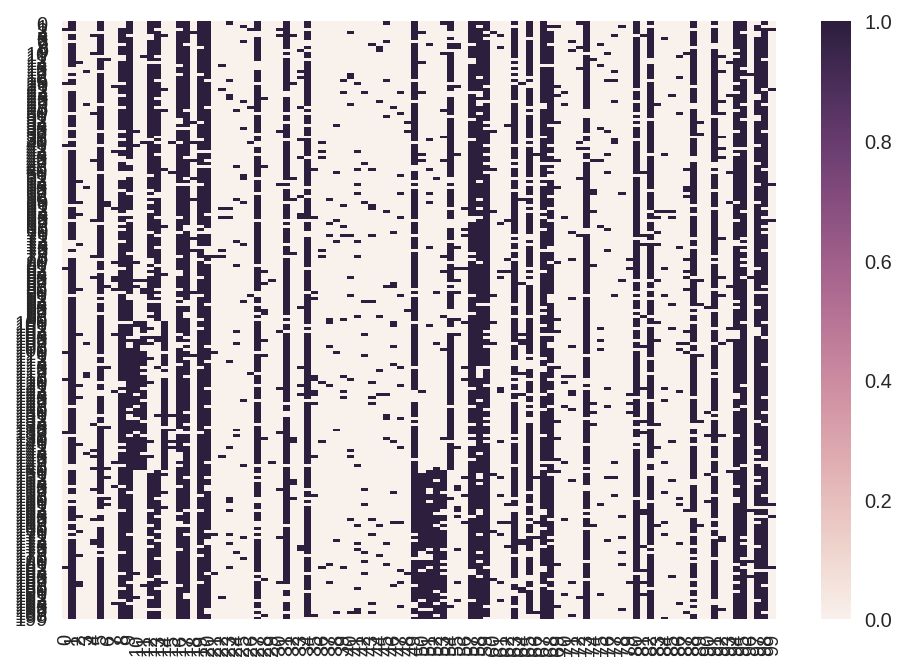

In [7]:
sns.heatmap(data)

In [271]:
data = data.T   # clustering of variants

### Real data

In [166]:
v = np.full((93, 888), 93, dtype=int)   # TODO: why discrepancy between len(out_seqs ) and width of consed output?

root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/backup/"
with open('%speak_small/peak.3.unit.1.seqs.V' % (root_dir), 'r') as f:
    for i, line in enumerate(f):
        v[i, :] = list(map(int, list(line.strip())))

data = v.T

In [425]:
data.shape

(888, 93)

### Main

In [17]:
class Cluster:
    def __init__(self):
        self.base_count = np.full((L, 2), 0.5 * alpha, dtype=float)
        #self.base_count = np.zeros((L, 2), dtype=float)
        self.ndata = 0
        self.log_factorial = 0.
        
    def add(self, data):
        for i, base in enumerate(data):
            self.base_count[i][base] += 1
        self.ndata += 1
        if self.ndata > 2:
            self.log_factorial += np.log(self.ndata - 1)
            
    def remove(self, data):
        for i, base in enumerate(data):
            self.base_count[i][base] -= 1
        self.ndata -= 1
        if self.ndata > 2:
            self.log_factorial -= np.log(self.ndata)
            
    def prob(self, data):
        logp = 0.
        for i, base in enumerate(data):
            logp += np.log(self.base_count[i][base] / np.sum(self.base_count[i]))
        return logp

In [18]:
def show_cluster():
    for i, cluster in c.items():
        print(i, cluster.base_count)

In [19]:
# Initialization of clustering

x = data   # array (N) of array (L), 0/1 element
alpha = 1
start_from_one_cluster=False


# Constant
N, L = x.shape

# To be optimized
s = np.zeros(N, dtype=int)   # cluster assignment of x
c = {}   # clusters

if not start_from_one_cluster:
    # Initial cluster assignment (each data belongs to each cluster)
    for i, xi in enumerate(x):
        cluster = Cluster()
        s[i] = i
        c[i] = cluster
        c[i].add(xi)
else:
    # another initial assignment (all data belong to 1 cluster)
    # NOTE: Before using this, solve the issue on the generation of a new cluster.
    cluster = Cluster()
    c[0] = cluster
    for i, xi in enumerate(x):
        s[i] = 0
        c[0].add(xi)
        
post_ncluster = []
max_post = -1000000.
max_s = s.copy()

In [20]:
# Calculation of posterior probability

log_AF = 0.   # constant
for n in range(N):
    log_AF += np.log(alpha + n)

log_gamma = gammaln(alpha) - 2. * gammaln(0.5 * alpha)   # constant

def calculate_posterior():
    # Ewens
    log_post = len(c) * np.log(alpha)
    for cluster in list(c.values()):
        log_post += cluster.log_factorial
    log_post -= log_AF

    # cluster generation and data assignment
    log_post += len(c) * L * log_gamma
    for idx, cluster in c.items():
        for i in range(L):
            for base in range(2):
                log_theta = np.log(cluster.base_count[i][base] / np.sum(cluster.base_count[i]))
                log_post += (cluster.base_count[i][base] - 1) * log_theta   # merged version
    
    return log_post

In [21]:
# Repeat Gibbs sampling

#verbose = True
verbose = False
ignore_post = False

log_normalizer_const = gammaln(alpha) - gammaln(alpha + 1) + gammaln(0.5 * alpha + 1) - gammaln(0.5 * alpha)
#log_normalizer_const = np.log(0.5)

for i in range(1000):
    #print("## --- step %d --- ##" % i)
    
    # Drop 1 assignment in s
    r = random.randint(0, N - 1)
    out_cluster = s[r]
    c[out_cluster].remove(x[r])
    
    if c[out_cluster].ndata == 0:
        del c[out_cluster]
    
    # probabilities to be assigned to existing clusters
    logp_cluster = np.zeros(len(c.keys()) + 1)
    for j, cluster in enumerate(c.values()):
        logp_cluster[j] = np.log(cluster.ndata) - np.log(N - 1 + alpha) + cluster.prob(x[r])

    # probability to be assigned to a new cluster
    logp_cluster[-1] = np.log(alpha) - np.log(N - 1 + alpha) + L * log_normalizer_const
    
    p_cluster = np.exp(logp_cluster) / np.sum(np.exp(logp_cluster))   # normalized probabilities for assignment
    p_acc_cluster = np.add.accumulate(p_cluster)   # accumulated probabilities
    
    # assign new cluster based on the p
    rnd = random.random()
    for j, p in enumerate(p_acc_cluster):
        if p >= rnd:
            if i < len(c):   # existing cluster
                c_idx = list(c.keys())[j]
            else:   # new cluster
                c_idx = max(list(c.keys())) + 1
                cluster = Cluster()
                c[c_idx] = cluster
            break

    if verbose:
        changed = "*" if s[r] != c_idx else " "
        print("%s%d (%d) -> %d (%d)" % (changed, r, s[r], i, c_idx), p_cluster)
    
    c[c_idx].add(x[r])
    s[r] = c_idx
    
    if ignore_post:
        continue
    
    post = calculate_posterior()
    if max_post < post:
        if verbose:
            print("# %f -> %f #" % (max_post, post), s)
        max_post = post
        max_s = s.copy()
    
    post_ncluster.append((post, len(c)))

In [196]:
def heatmap_partition(data, cluster_index, partition_width=1):
    d = np.insert(data, 0, -1, axis=1)   # dummy data for partition lines
    order = [0] * partition_width
    for idx in set(cluster_index):
        order += np.where(cluster_index == idx)[0].tolist()
        order += [0] * partition_width
    plt.subplots(figsize=(18,15))
    sns.heatmap(d[:, order], cbar=False)

### Synthetic data

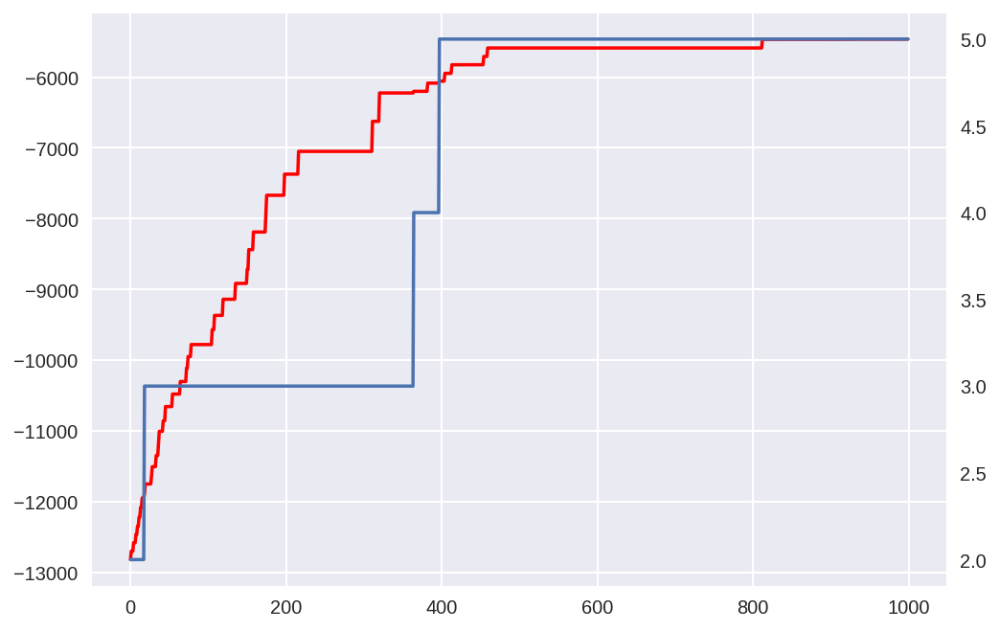

In [279]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[0:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:]])
plt.grid(False)
plt.show()

In [280]:
s

array([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 2, 4, 4, 2, 4, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 3, 3, 3, 3, 3, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 0])

In [281]:
max_s

array([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 2, 4, 4, 2, 4, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 3, 3, 3, 3, 3, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 0])

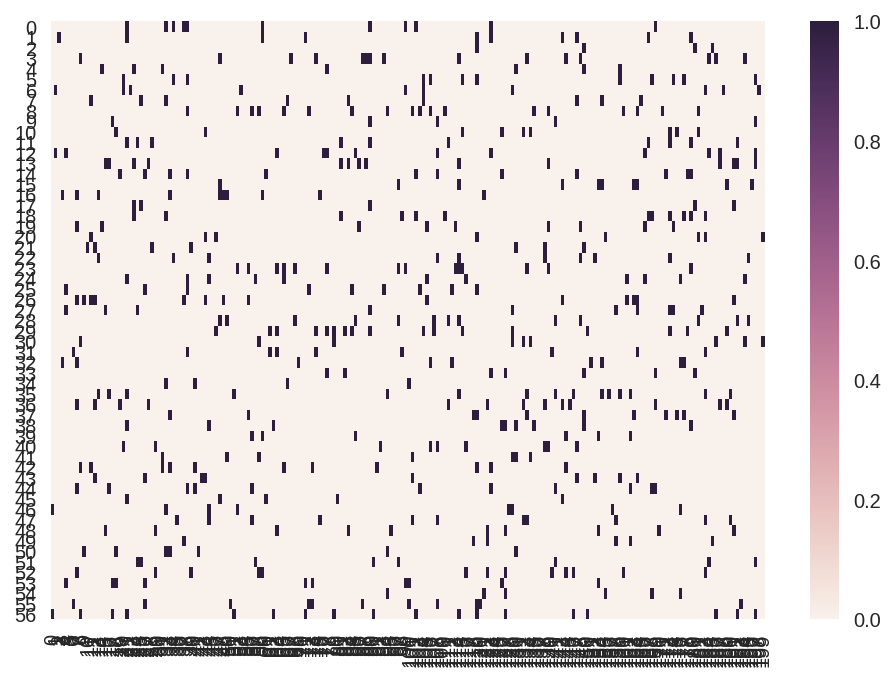

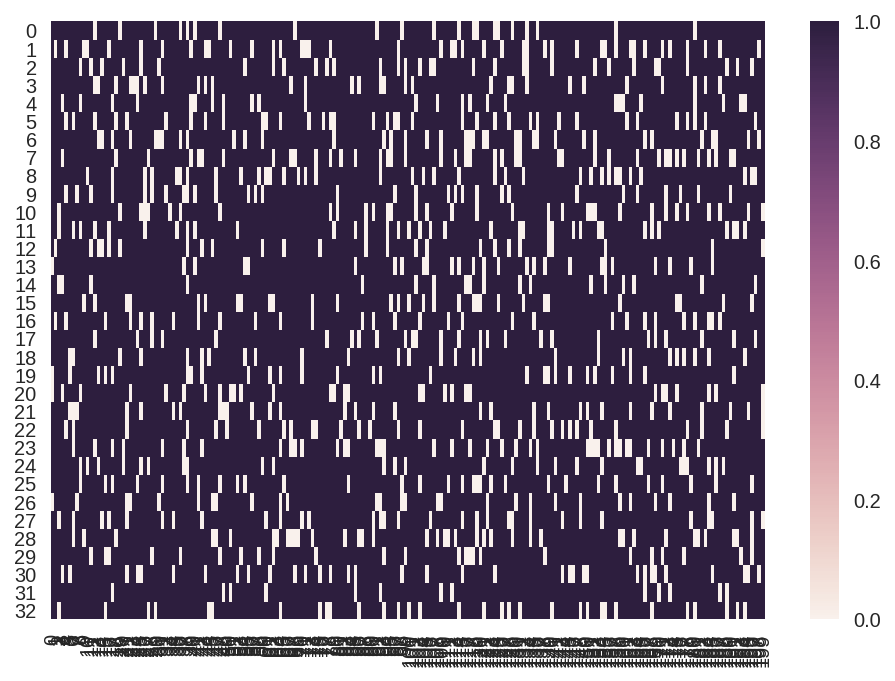

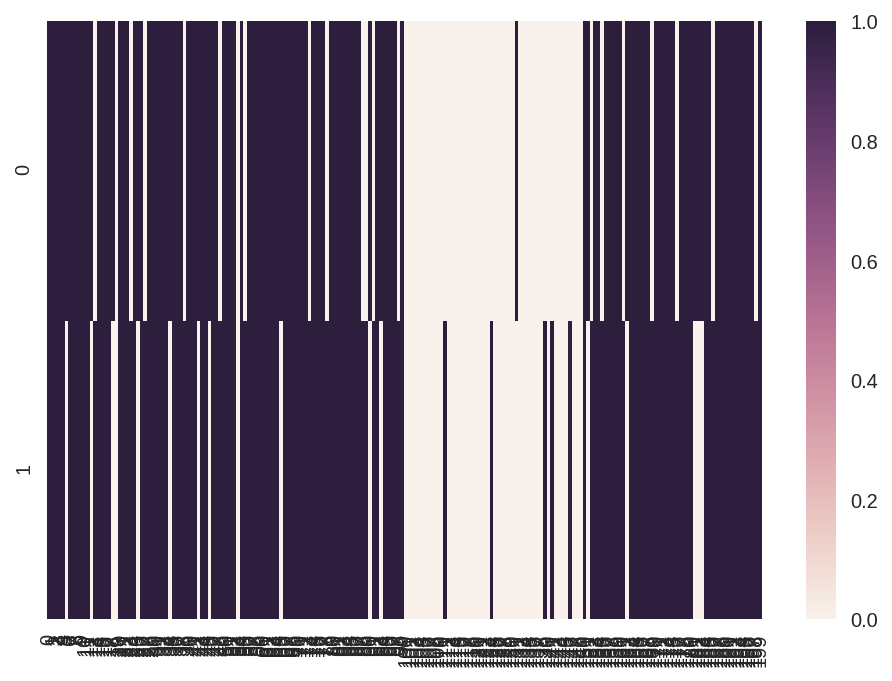

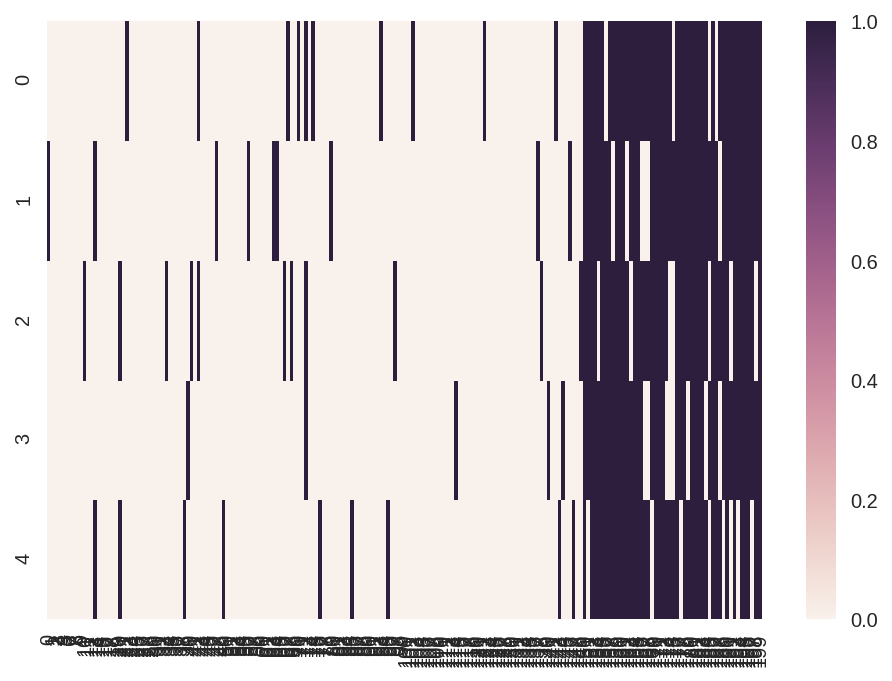

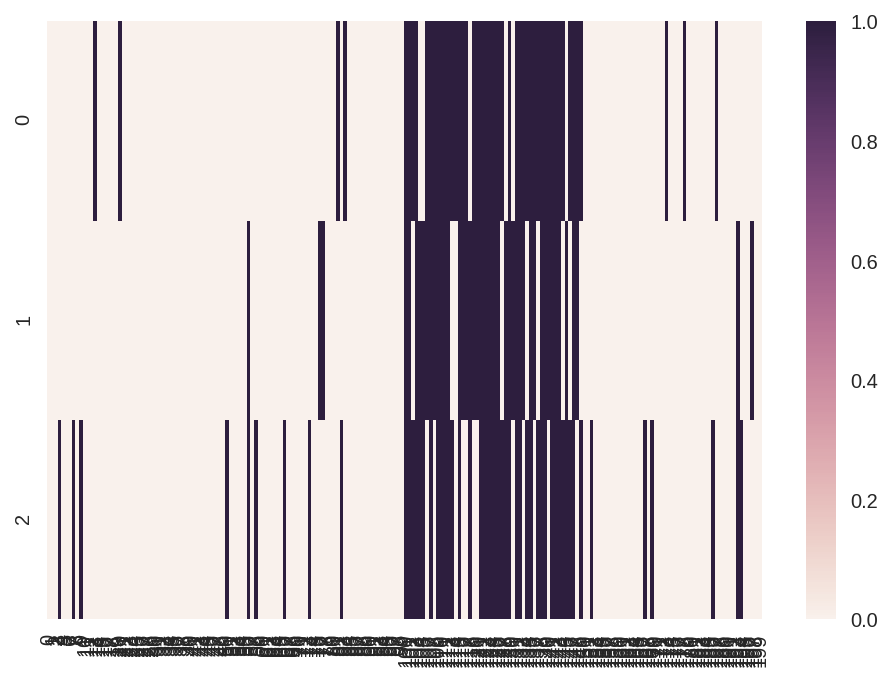

In [282]:
cluster_index = max_s

for i in list(set(cluster_index)):
    sns.heatmap(data.T[:, np.where(cluster_index == i)[0]].T)
    plt.show()

-> **[MAJOR FIX]** Avoid local minima (excessive merge of clusters). Adjusting the probability of generating a new cluster?

(When excessiveness occurs, the posterior probability is actually smaller than that of the true clustering.)

### Init K=N

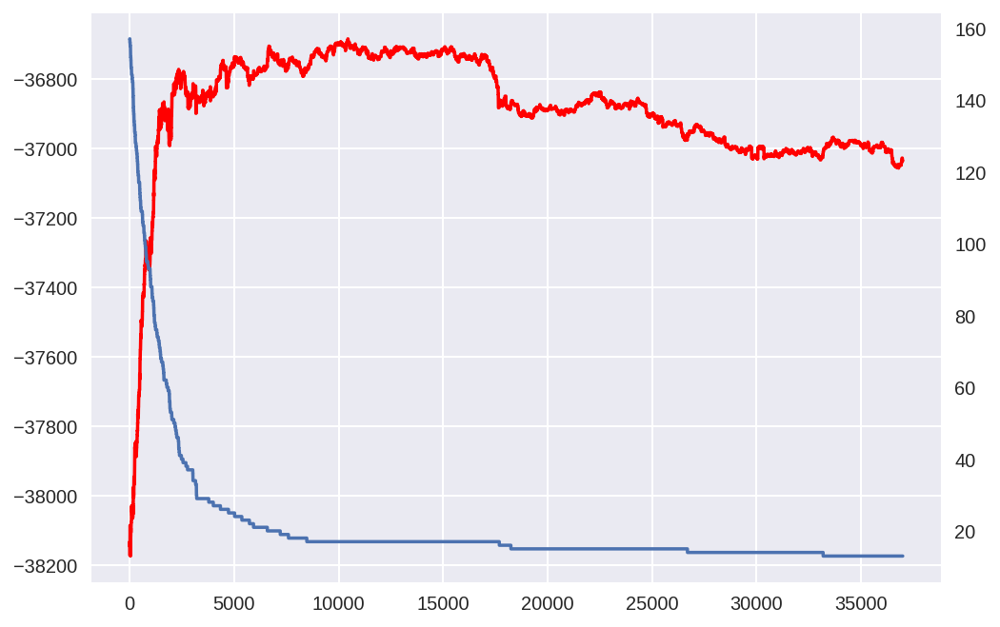

In [504]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[2000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[2000:]])
plt.grid(False)
plt.show()

In [505]:
print(post, max_post)
print(len(set(s)), len(set(max_s)))

-37035.3327914 -36684.0309936


In [507]:
max_s

array([799, 657, 657, 657, 887, 887, 887, 887, 887, 254, 887, 254, 887,
       887, 424, 707, 707, 657, 657, 657, 657, 657, 657, 657, 657, 657,
       657, 657, 657, 657, 657, 887, 372, 254, 887, 372, 887,  37, 887,
       887, 887, 887, 265, 887, 887, 887, 887, 887, 887, 887, 887, 887,
       372, 887, 887, 887, 887, 887,  37,  37,  37, 887, 887, 887, 372,
       254, 272, 887, 887, 887, 887, 887, 887, 887, 254, 887, 254, 887,
       254, 272, 254, 254, 887, 372, 887, 272, 272, 887, 272, 272, 272,
       887, 272, 887, 657, 657, 272, 887, 887, 887, 372, 272, 887, 887,
       887, 254, 887, 887, 424, 887, 887, 887, 887, 887, 887,  57, 372,
        57, 272, 887, 887, 887, 887, 887, 424, 887, 887, 887, 372,  57,
       887, 272, 272, 272, 272, 272, 272, 272, 272, 254, 777, 254, 777,
       887, 777, 887, 887, 887, 887, 887, 254, 777, 887, 777, 372, 887,
       777, 887, 777, 777, 777, 887, 777, 777, 777, 887, 777, 887, 777,
       887, 887, 887, 887, 887, 887, 887, 272, 272, 887, 887, 27

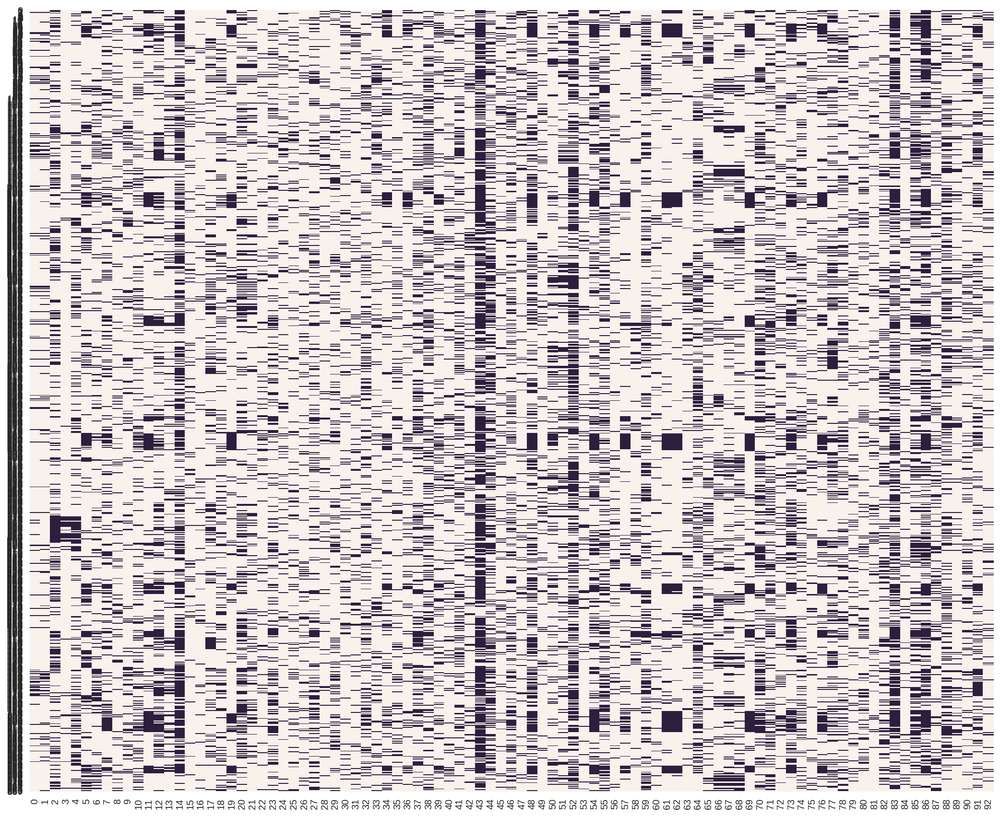

In [488]:
plt.subplots(figsize=(18,15))
sns.heatmap(v.T, cbar=False)   # Entire heatmap (units x variants)

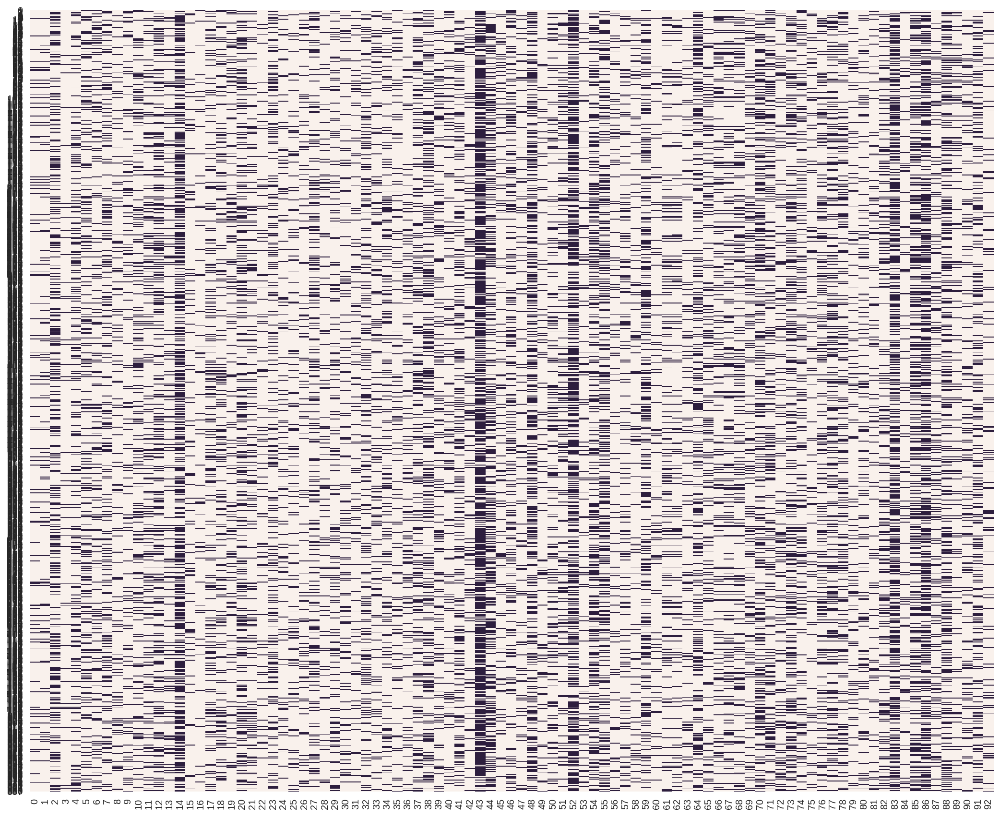

In [285]:
plt.subplots(figsize=(18,15))
sns.heatmap(np.random.permutation(v.T), cbar=False)   # Permutated entire heatmap (units x variants)

-> 連続情報を使うべきか。61,62なんかはpermutationがかき消える。(DPMMでクラスタにはできてる)

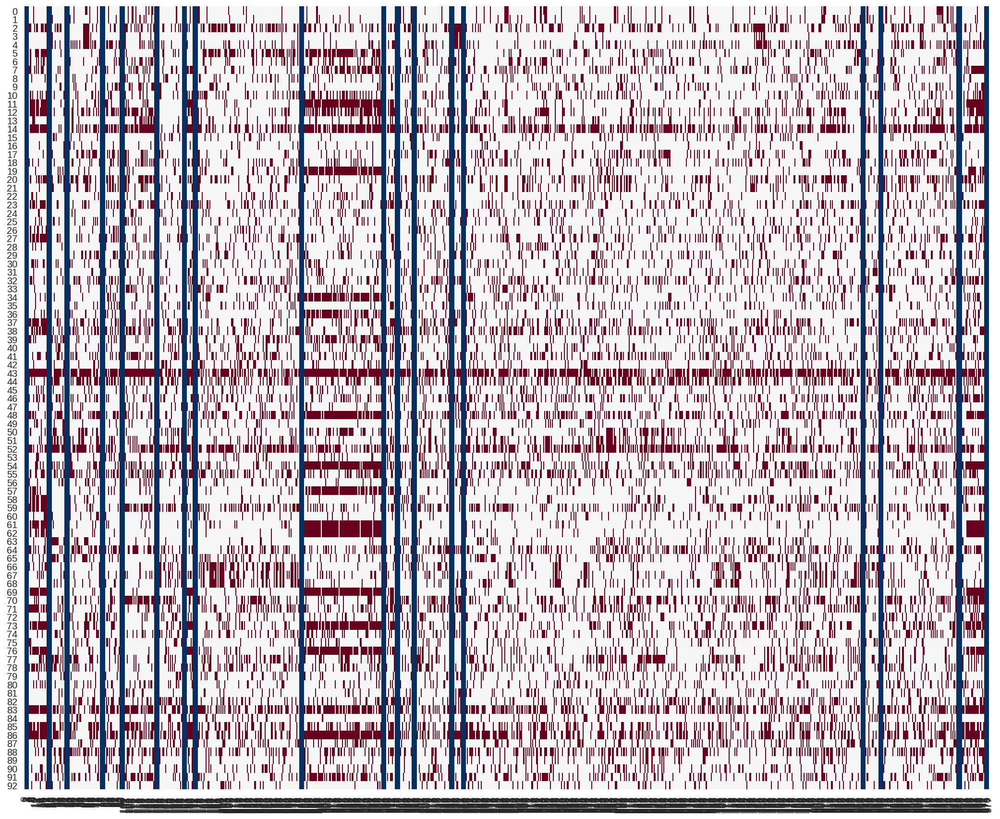

In [37]:
heatmap_partition(v, cluster_index, partition_width=5)

-> 一度クラスタが消滅すると新しく生成されることはない

-> merging criteria (cluster selection)としてはまずまずだが、clustering としてはまだまだ。ランダムの定義(新しいクラスタ)を改良

-> 0と1の違いも反映させたい

### Second time

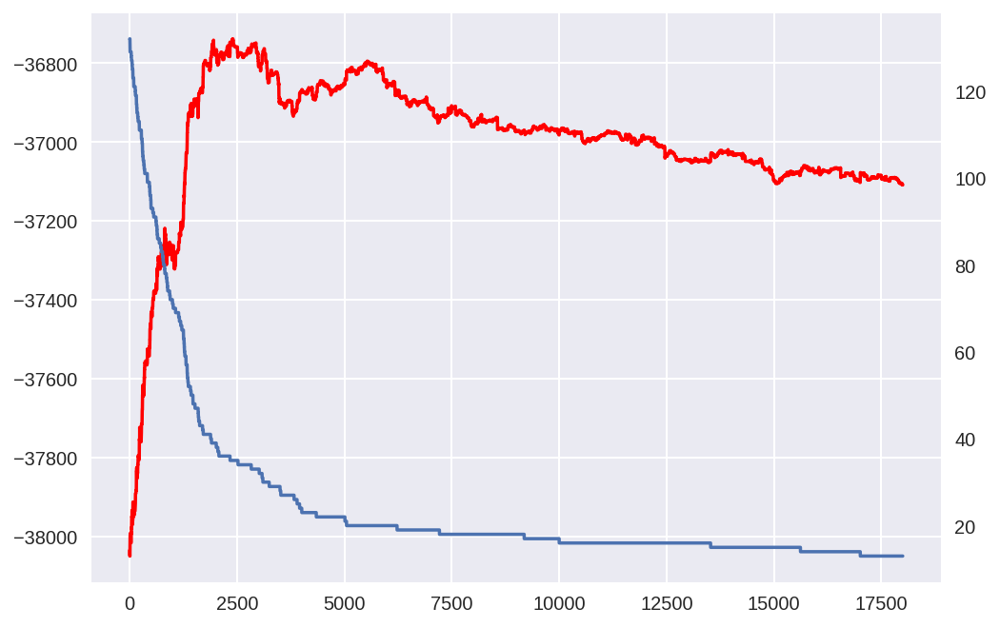

In [15]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[2000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[2000:]])
plt.grid(False)
plt.show()

In [16]:
print(post, max_post)
print(len(set(s)), len(set(max_s)))

-37108.811738 -36738.1084671
13 35


In [17]:
max_s

array([858, 858, 858, 858, 432, 887, 432, 432, 432, 887, 887, 432, 432,
       432, 432,  15,  15, 858, 858, 858, 858, 858, 858, 858, 858, 858,
       858, 858,  28, 858, 858, 332, 887, 887, 887, 777, 315, 332, 432,
       887, 887, 887, 109, 887, 887, 432, 432, 887, 432, 887, 887, 332,
       887, 887, 887, 887, 332, 432, 332, 332, 332, 887, 345, 887, 887,
       748, 887, 432, 887, 887, 432, 887, 887, 432, 283, 432, 748, 887,
       432, 887, 748, 748, 887, 887, 887, 887, 272, 432, 870, 870, 272,
       432, 870, 887, 858, 858, 887, 332, 887, 432, 887, 887, 887, 432,
       887, 432, 887, 432, 432, 887, 432, 887, 887, 887, 887, 432, 887,
       432, 887, 887, 887, 887, 887, 887, 432, 887, 887, 887, 887, 432,
       887, 272, 887, 272, 272, 887, 870, 272, 272, 748, 777, 748, 777,
       432, 777, 887,  68, 761, 887, 432, 748, 703, 887, 777, 432, 887,
       432, 887, 777, 777, 432, 432, 703, 552, 777, 432, 166, 887, 777,
       887, 887, 887, 887, 887, 887, 887, 887, 870, 887, 432, 87

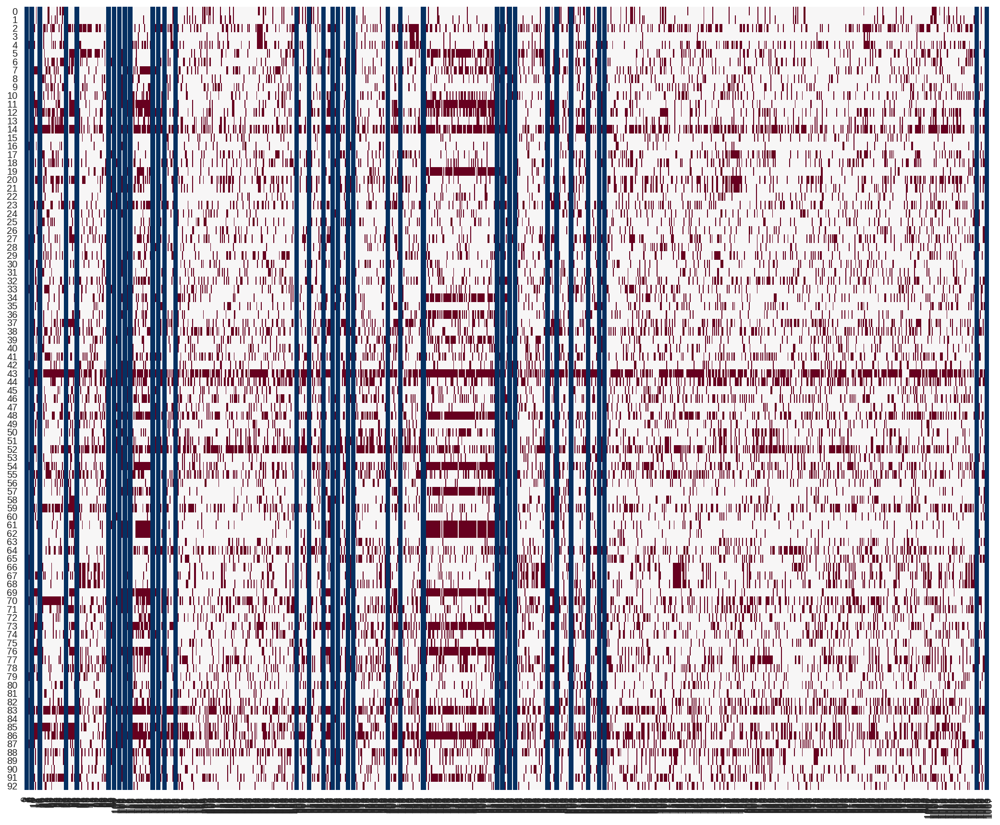

In [18]:
heatmap_partition(v, max_s, partition_width=5)

### Third time

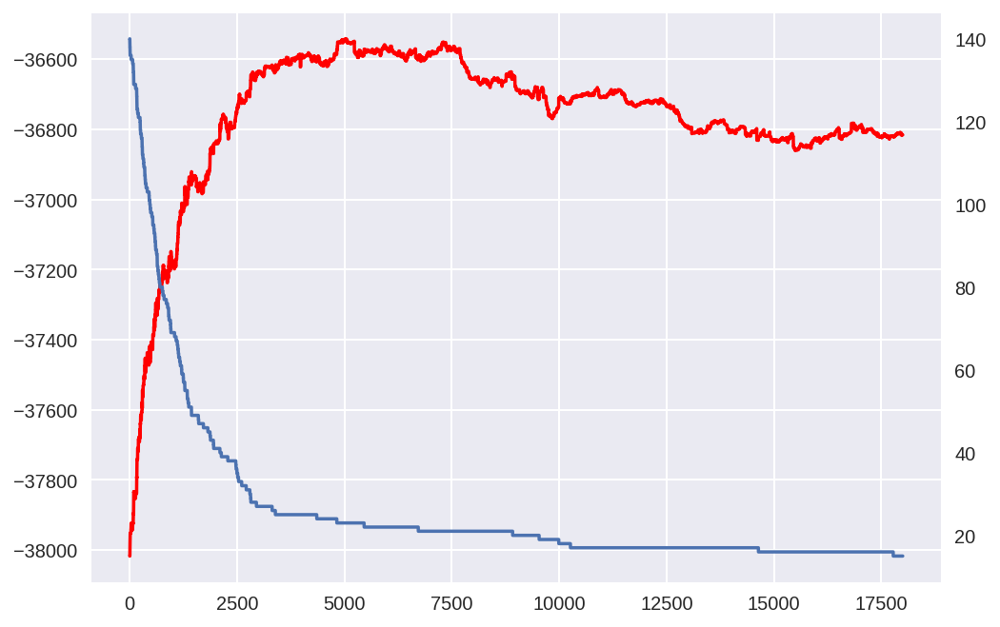

In [27]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[2000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[2000:]])
plt.grid(False)
plt.show()

In [28]:
print(post, max_post)
print(len(set(s)), len(set(max_s)))

-36815.8781836 -36542.0586377
15 23


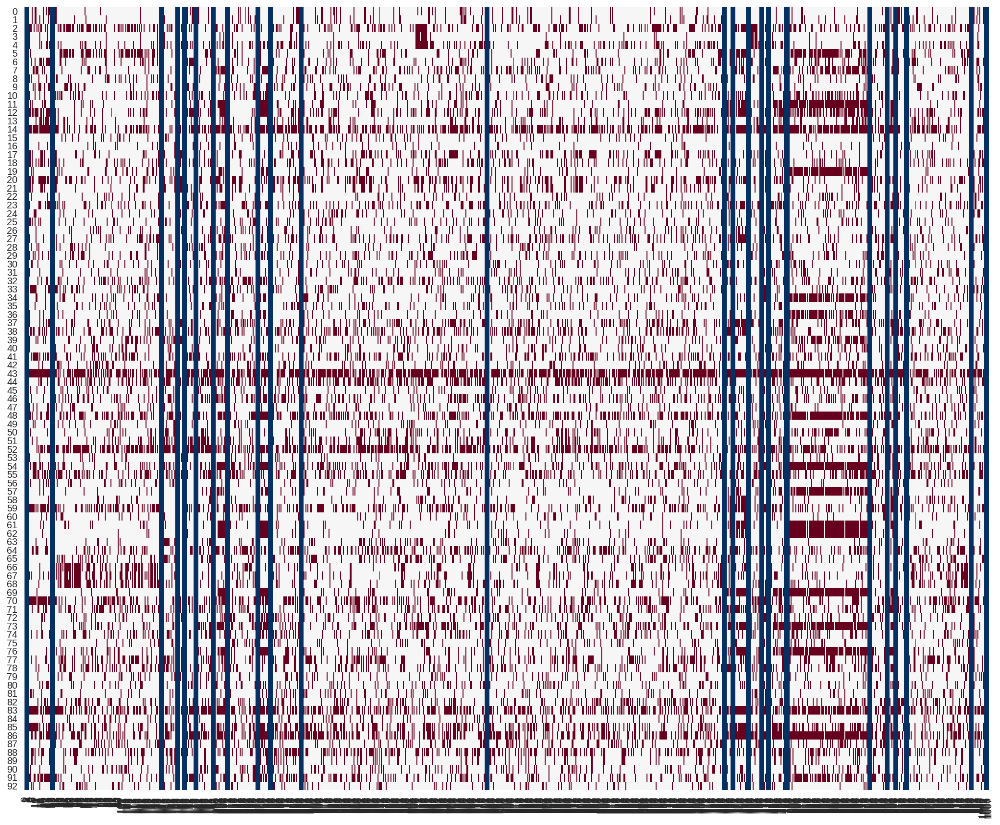

In [30]:
heatmap_partition(v, max_s, partition_width=5)

### Forth time

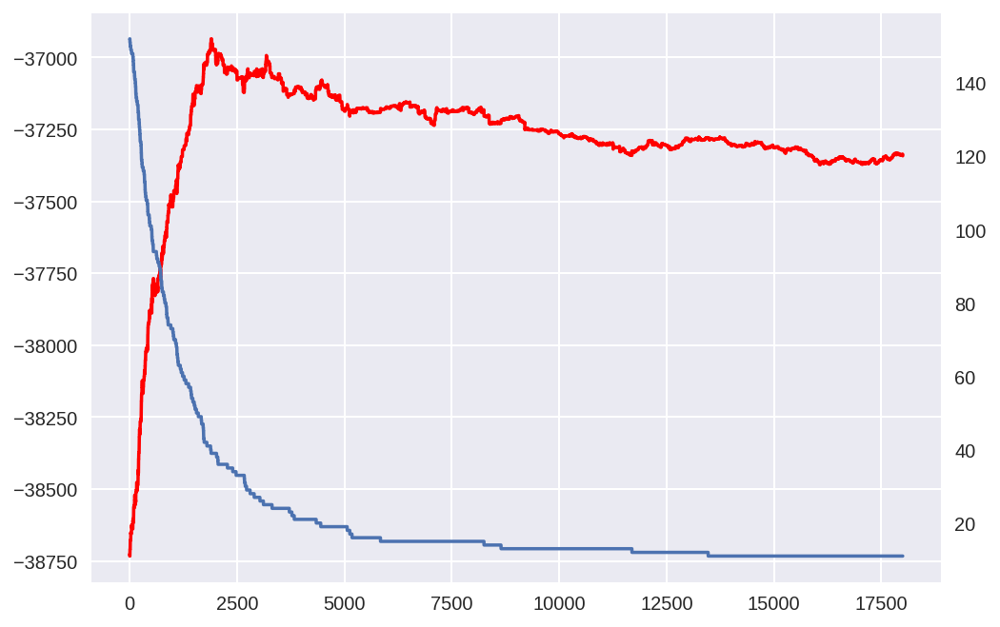

In [33]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[2000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[2000:]])
plt.grid(False)
plt.show()

In [34]:
print(post, max_post)
print(len(set(s)), len(set(max_s)))

-37341.9635079 -36935.4273779
11 39


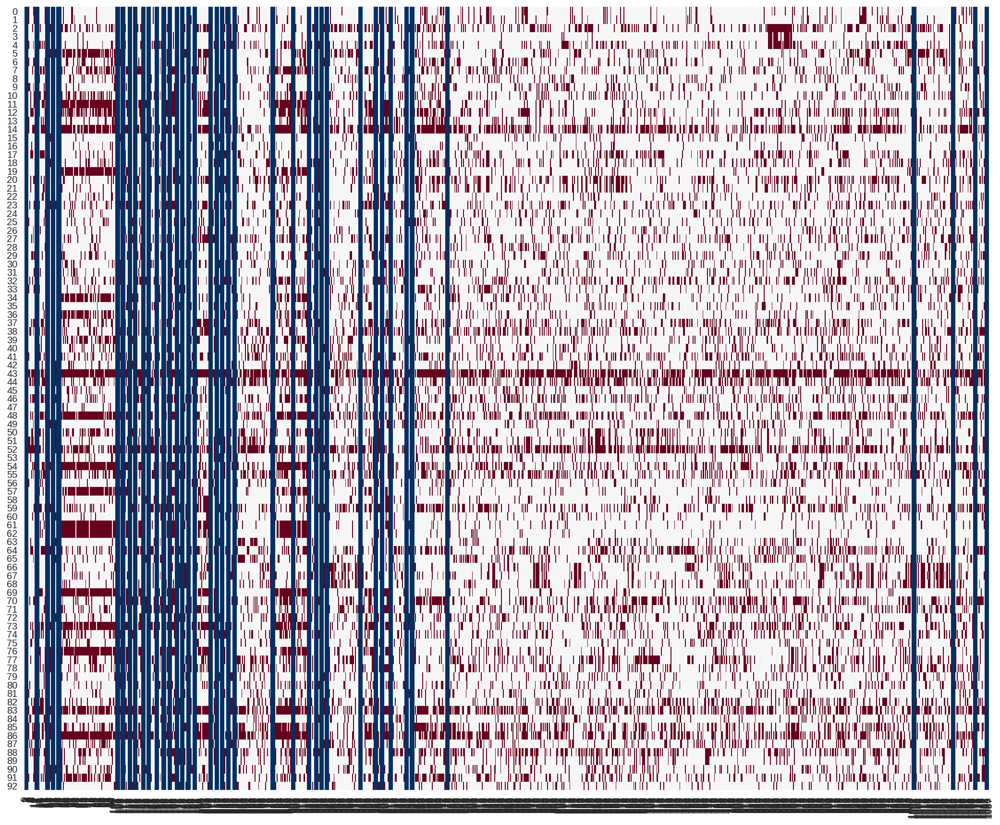

In [35]:
heatmap_partition(v, max_s, partition_width=5)

## Split-merge Gibbs sampling

In [6]:
class Cluster:
    def __init__(self):
        self.base_count = np.full((L, 2), 0.5 * alpha, dtype=float)
        self.ndata = 0   # cluster size
        self.log_factorial = 0.   # for calculation of Ewens
        
    def add(self, data):
        for i, base in enumerate(data):
            self.base_count[i][base] += 1
        self.ndata += 1
        if self.ndata > 2:
            self.log_factorial += np.log(self.ndata - 1)
            
    def remove(self, data):
        for i, base in enumerate(data):
            self.base_count[i][base] -= 1
        self.ndata -= 1
        if self.ndata > 2:
            self.log_factorial -= np.log(self.ndata)
            
    def prob(self, data):
        logp = 0.
        for i, base in enumerate(data):
            logp += np.log(self.base_count[i][base] / np.sum(self.base_count[i]))
        return logp
    
def show_cluster(c_):
    for i, cluster in c_.items():
        print(i, cluster.base_count)

In [9]:
# Initialization of clustering

x = data   # array (N) of array (L), 0/1 element
alpha = 1.
start_from_one_cluster=True


# Constant
N, L = x.shape

# To be optimized
s = np.zeros(N, dtype=int)   # cluster assignment of x
c = {}   # clusters

if start_from_one_cluster:
    # Initial cluster assignment (all data belong to 1 cluster)
    cluster = Cluster()
    c[0] = cluster
    for i, xi in enumerate(x):
        s[i] = 0
        c[0].add(xi)
else:
    # Another initial cluster assignment (each data belongs to each cluster)
    for i, xi in enumerate(x):
        cluster = Cluster()
        s[i] = i
        c[i] = cluster
        c[i].add(xi)

post_ncluster = []
max_post = -1000000.
max_s = s.copy()

In [10]:
# Calculation of posterior probability

log_AF = 0.   # constant
for n in range(N):
    log_AF += np.log(alpha + n)

log_gamma = gammaln(alpha) - 2. * gammaln(0.5 * alpha)   # constant

def calculate_posterior():   # TODO: update by using only difference from the previous state
    # Ewens
    log_post = len(c) * np.log(alpha)
    for cluster in list(c.values()):
        log_post += cluster.log_factorial
    log_post -= log_AF

    # cluster generation and data assignment
    log_post += len(c) * L * log_gamma
    for idx, cluster in c.items():
        for i in range(L):
            for base in range(2):
                log_theta = np.log(cluster.base_count[i][base] / np.sum(cluster.base_count[i]))
                log_post += (cluster.base_count[i][base] - 1) * log_theta   # merged version
    
    return log_post

In [77]:
# Repeat split-merge Gibbs sampling

#verbose = True
verbose = False
ignore_post = False

log_normalizer_const = gammaln(alpha) - gammaln(alpha + 1) + gammaln(0.5 * alpha + 1) - gammaln(0.5 * alpha)
#log_normalizer_const = np.log(0.5)

for i in range(5000):
    if verbose:
        print("## --- step %d --- ##" % i)
        print(s)
        print(c)
    
    # Sample two distinct data
    init_i, init_j = random.sample(range(N), k=2)
    
    # Set initial launch state
    s_launch = s.copy()
    c_launch = copy.deepcopy(c)
    
    if s[init_i] == s[init_j]:   # Split
        # Collect a set of restricted observed data
        x_restricted = []
        for j in range(N):
            if j == init_i or j == init_j:
                continue
            if s[j] == s[init_i] or s[j] == s[init_j]:
                x_restricted.append(j)
                
        # Create 2 new clusters consisting of only x[init_i] and x[init_j] respectively, and delete the cluster to which they originally belonged
        # (for the simplification of the following computation)
        # for init_i
        c_idx = max(list(c_launch.keys())) + 1
        cluster = Cluster()
        c_launch[c_idx] = cluster
        c_launch[c_idx].add(x[init_i])   # TODO: make a function "create_new_cluster"
        s_launch[init_i] = c_idx
        # for init_j
        c_idx = max(list(c_launch.keys())) + 1
        cluster = Cluster()
        c_launch[c_idx] = cluster
        c_launch[c_idx].add(x[init_j])
        s_launch[init_j] = c_idx
        # delete
        del c_launch[s[init_i]]
        
        c_restricted = [s_launch[init_i], s_launch[init_j]]   # restricted (new) cluster indices for init_i and init_j
        
        if verbose:
            print(init_i, "(%s)" % s[init_i], init_j, "(%s)" % s[init_j], "---(split)--->", c_restricted)
            print(x_restricted)

        # Initial random assignment
        for idx in x_restricted:
            s_launch[idx] = random.choice(c_restricted)
            
        if verbose:
            print("#INITIAL ASSIGNMENT#")
            print(s_launch)

        ## Perform restricted Gibbs sampling (first sequential scan + several random sampling) on x_resticted
        # First sequential scan (batch update)
        p_acc_cluster_first = np.zeros((len(x_restricted), 2))   # [:, 0] for init_i, [:, 1] for init_j
        for j, idx in enumerate(x_restricted):   # First sequential scan
            logp_cluster = np.array([c_launch[c_idx].prob(x[idx]) for c_idx in c_restricted])   # single-vs-single
            p_cluster = np.exp(logp_cluster)
            p_acc_cluster_first[j, :] = np.add.accumulate(p_cluster / np.sum(p_cluster))

        # First assignments to one of the two clusters
        for j, idx in enumerate(x_restricted):
            rnd = random.random()
            for k, p in enumerate(p_acc_cluster_first[j]):
                if p >= rnd:
                    c_idx = c_restricted[k]
                    c_launch[c_idx].add(x[idx])
                    s_launch[idx] = c_idx
                    break
                    
        if verbose:
            print("#FIRST ASSIGNMENT#")
            print(s_launch)
                    
        # Additional Gibbs sampling
        for ii in range(100):   # TODO: change iteration number according to cluster sizes
            # Select one (restricted) data randomly
            r = x_restricted[random.randint(0, len(x_restricted) - 1)]
            c_launch[s_launch[r]].remove(x[r])
            
            # Calculate probabilities of assignment
            logp_cluster = np.array([c_launch[c_idx].prob(x[r]) for c_idx in c_restricted])   # single-vs-single
            p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
            p_acc_cluster = np.add.accumulate(p_cluster / np.sum(p_cluster))

            # Assignment
            rnd = random.random()
            for k, p in enumerate(p_acc_cluster):
                if p >= rnd:
                    c_idx = c_restricted[k]
                    c_launch[c_idx].add(x[r])
                    s_launch[r] = c_idx
                    break
                    
            # TODO: should calculate posterior probability and select a result with highest value?
            
        if verbose:
            print("#LAST ASSIGNMENT#")
            print(s_launch)
            
        # Calculate q(c^split | c)
        logq = 0.
        for j in range(N):
            if j == init_i or j == init_j:   # to avoid removing these data when a cluster consists of only one of them   # TODO: is this proper?
                continue
            for k in range(2):
                if s_launch[j] == c_restricted[k]:
                    c_launch[c_restricted[k]].remove(x[j])   # temporarily remove the data
                    logp_cluster = np.array([c_launch[c_idx].prob(x[j]) for c_idx in c_restricted])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[c_restricted[k]].add(x[j])   # restore the data
                    break
                    
        # Calculate probabilities used for acceptance ratio
        logp_transition = -logq
        
        logp_ewens = np.log(alpha)
        for j in range(2):
            logp_ewens += c_launch[c_restricted[j]].log_factorial
        logp_ewens -= c[s[init_i]].log_factorial
        
        logp_ratio = 0.
        for c_idx in c_restricted:
            cluster = c_launch[c_idx]
            logp_ratio_sub = 0.
            #print(cluster.base_count)
            for k in range(L):
                for base in range(2):
                    log_theta = np.log(cluster.base_count[k][base] / np.sum(cluster.base_count[k]))   # TODO: sumはkによらず常に一定
                    logp_ratio_sub += (cluster.base_count[k][base] - 0.5 * alpha) * log_theta   # TODO: why -1? -0.5 * alpha???
            if verbose:
                print("logp_cluster_new", c_idx, "=", logp_ratio_sub)
            logp_ratio += logp_ratio_sub
        logp_ratio_sub = 0.
        cluster = c[s[init_i]]
        for k in range(L):
            for base in range(2):
                log_theta = np.log(cluster.base_count[k][base] / np.sum(cluster.base_count[k]))
                logp_ratio_sub += (cluster.base_count[k][base] - 0.5 * alpha) * log_theta
        if verbose:
            print("logp_cluster original =", logp_ratio_sub)
        logp_ratio -= logp_ratio_sub
        logp_ratio += L * log_gamma   # TODO: necessary?
    
    else:   # Merge
        c_restricted = [s[init_i], s[init_j]]   # indices of the clusters to be merged
        
        if verbose:
            print(init_i, "(%s)" % s[init_i], init_j, "(%s)" % s[init_j], "---(merge)--->", s[init_j])
        
        # Calculate q(c | c^merge)
        logq = 0.
        for j in range(N):
            if j == init_i or j == init_j:   # to avoid removing these data when a cluster consists of only one of them
                continue
            for k in range(2):
                if s[j] == c_restricted[k]:
                    c_launch[c_restricted[k]].remove(x[j])   # temporarily remove the data
                    logp_cluster = np.array([c_launch[c_idx].prob(x[j]) for c_idx in c_restricted])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[c_restricted[k]].add(x[j])   # restore the data
                    break
        
        # Merge two clusters
        for j in range(N):
            if s[j] == s[init_i]:
                c_idx = s[init_j]
                c_launch[c_idx].add(x[j])
                s_launch[j] = c_idx
        del c_launch[s[init_i]]
        
        # Calculate probabilities used for acceptance ratio
        logp_transition = logq
        
        logp_ewens = -np.log(alpha)
        logp_ewens += c_launch[s_launch[init_j]].log_factorial
        for j in range(2):
            logp_ewens -= c[c_restricted[j]].log_factorial
            
        logp_ratio = 0.
        logp_ratio_sub = 0.
        cluster = c_launch[s_launch[init_j]]
        for k in range(L):
            for base in range(2):
                log_theta = np.log(cluster.base_count[k][base] / np.sum(cluster.base_count[k]))
                logp_ratio_sub += (cluster.base_count[k][base] - 0.5 * alpha) * log_theta
        if verbose:
            print("logp_cluster_new", s_launch[init_j], "=", logp_ratio_sub)
        logp_ratio += logp_ratio_sub
        for c_idx in c_restricted:
            cluster = c[c_idx]
            logp_ratio_sub = 0.
            for k in range(L):
                for base in range(2):
                    log_theta = np.log(cluster.base_count[k][base] / np.sum(cluster.base_count[k]))
                    logp_ratio_sub += (cluster.base_count[k][base] - 0.5 * alpha) * log_theta
            if verbose:
                print("logp_cluster original", c_idx, "=", logp_ratio_sub)
            logp_ratio -= logp_ratio_sub
        logp_ratio -= L * log_gamma   # TODO: necessary?
    
    # Proposal
    logp_proposal = min(0, logp_transition + logp_ewens + logp_ratio)
    if verbose:
        print(logp_proposal, "=", logp_transition, "+", logp_ewens, "+", logp_ratio)
    p_proposal = np.exp(logp_proposal)
    
    rnd = random.random()
    accepted = False
    if p_proposal >= rnd:
        accepted = True
        c = copy.deepcopy(c_launch)
        s = s_launch.copy()
        
    if ignore_post:
        continue

    if accepted is True:   # Calculate posterior only when the new state is accepted
        logp_post = calculate_posterior()
    
        updated = "*" if max_post < logp_post else ""
        if verbose:
            print("%sposterior: %f (max so far = %f)" % (updated, logp_post, max_post))
        if updated == "*":
            max_post = logp_post
            max_s = s.copy()
    
    post_ncluster.append((logp_post, len(c)))

In [201]:
# Repeat Gibbs sampling

#verbose = True
verbose = False
ignore_post = False

log_normalizer_const = gammaln(alpha) - gammaln(alpha + 1) + gammaln(0.5 * alpha + 1) - gammaln(0.5 * alpha)
#log_normalizer_const = np.log(0.5)

for iteration in range(10000):
    #print("## --- step %d --- ##" % iteration)
    
    # Drop 1 assignment in s
    r = random.randint(0, N - 1)
    out_cluster = s[r]
    c[out_cluster].remove(x[r])
    
    if c[out_cluster].ndata == 0:
        del c[out_cluster]
    
    # probabilities to be assigned to existing clusters
    logp_cluster = np.zeros(len(c.keys()) + 1)
    for i, cluster in enumerate(c.values()):
        logp_cluster[i] = np.log(cluster.ndata) - np.log(N - 1 + alpha) + cluster.prob(x[r])

    # probability to be assigned to a new cluster
    logp_cluster[-1] = np.log(alpha) - np.log(N - 1 + alpha) + L * log_normalizer_const
    
    p_cluster = np.exp(logp_cluster) / np.sum(np.exp(logp_cluster))   # normalized probabilities for assignment
    p_acc_cluster = np.add.accumulate(p_cluster)   # accumulated probabilities
    
    # assign new cluster based on the p
    rnd = random.random()
    for i, p in enumerate(p_acc_cluster):
        if p >= rnd:
            if i < len(c):   # existing cluster
                c_idx = list(c.keys())[i]
            else:   # new cluster
                c_idx = max(list(c.keys())) + 1
                cluster = Cluster()
                c[c_idx] = cluster
            break

    if verbose:
        changed = "*" if s[r] != c_idx else " "
        print("%s%d (%d) -> %d (%d)" % (changed, r, s[r], i, c_idx), p_cluster)
    
    c[c_idx].add(x[r])
    s[r] = c_idx
    
    if verbose and changed == "*":
        print(s)
    
    if ignore_post:
        continue
    
    post = calculate_posterior()
    if max_post < post:
        if verbose:
            print("# %f -> %f #" % (max_post, post), s)
        max_post = post
        max_s = s.copy()
    
    post_ncluster.append((post, len(c)))

## Synthetic data

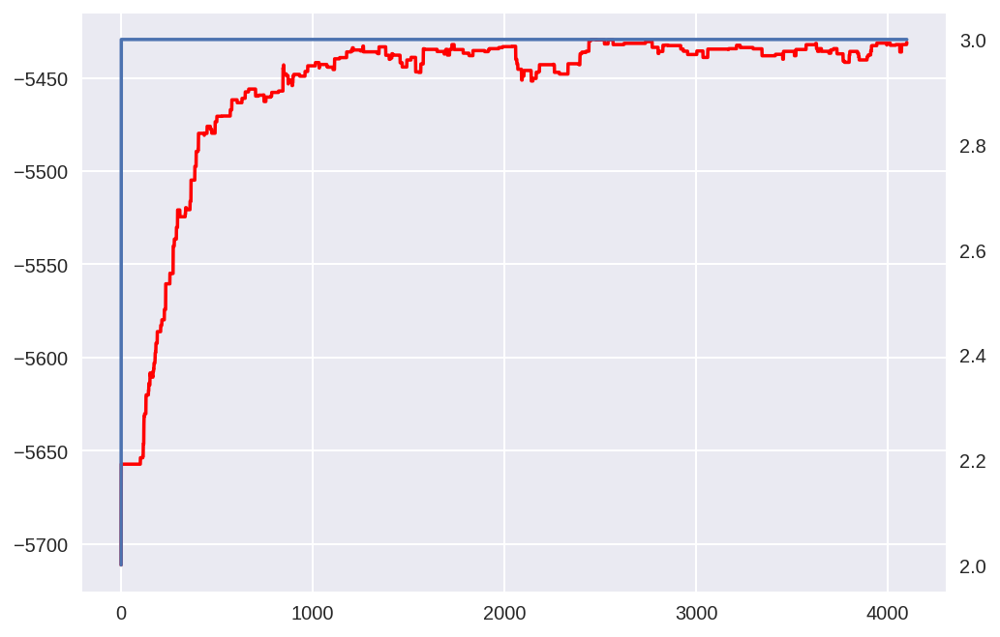

In [163]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[0:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:]])
plt.grid(False)
plt.show()

In [164]:
max_s

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 4, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       4, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

## Real data

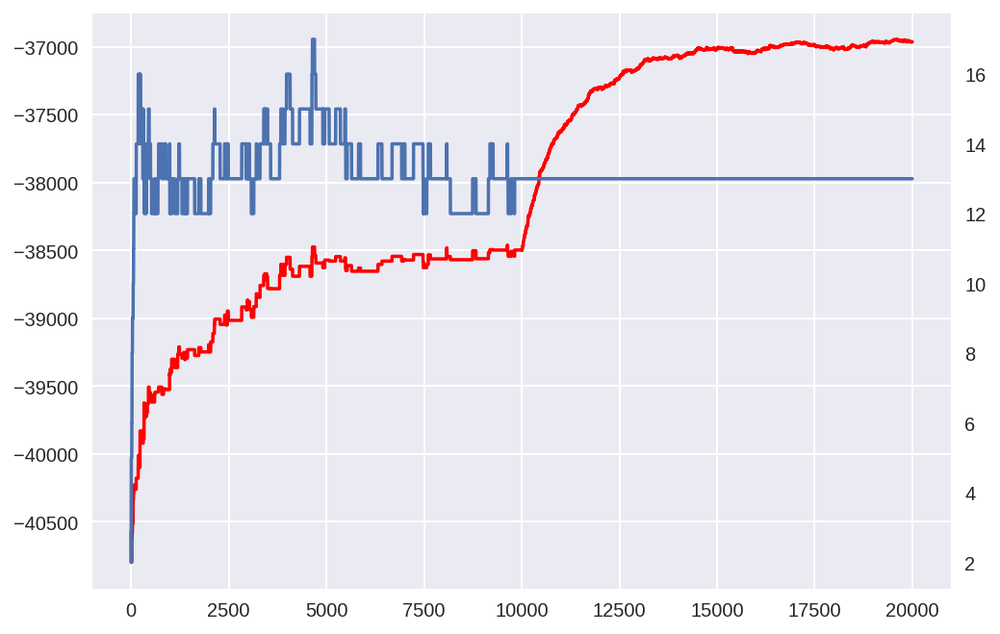

In [205]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[0:20000]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:20000]])
plt.grid(False)
plt.show()

~10000 iterations: split-merge MCMC (MH + local Gibbs sampling), 10000~40000 iterations: Gibbs sampling

In [203]:
max_s

array([116, 116, 116, 116, 154, 150, 154, 154, 154, 155, 155, 141, 154,
       154, 154, 106, 106, 116, 116, 116, 116, 116, 116, 116, 116, 116,
       116, 116, 116, 116, 116, 110, 155, 155, 150,  89, 156, 110, 110,
       150, 156, 141, 156, 110, 154, 154, 154, 110, 154, 150, 150, 110,
       156, 110, 150, 150, 110, 110, 110, 110, 110, 155, 156, 155, 155,
       155, 127, 154, 150, 154, 154, 155, 154, 154, 155, 154, 155, 154,
       155, 127, 155, 155, 150, 127, 150, 146, 146, 154, 146, 146, 146,
       154, 146, 154, 116, 116, 141, 110, 150, 110, 127, 150, 150, 154,
       150, 141, 150, 154, 141, 154, 154, 150, 155, 155, 150, 154, 127,
       154, 154, 141, 155, 141, 156, 155, 154, 150, 156, 150, 155, 154,
       150, 146, 146, 146, 146, 146, 146, 146, 146, 155,  89, 155,  89,
       154,  89, 150, 154, 141, 150, 141, 155,  89, 141,  89, 154, 150,
       141, 154,  89,  89,  89, 154, 141,  89,  89, 141,  89, 141,  89,
       150, 150, 154, 150, 154, 150, 154, 146, 146, 154, 154, 14

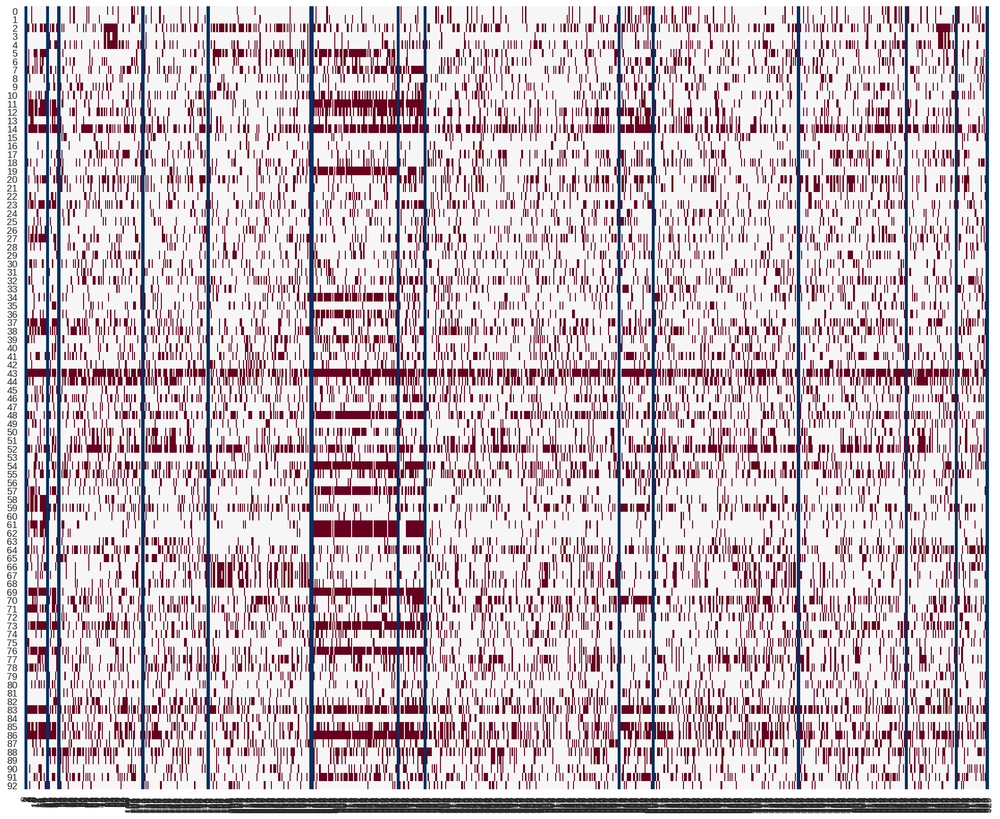

In [204]:
heatmap_partition(v, max_s, partition_width=3)

## Large real data

In [2]:
from dacenter_run import *

In [25]:
# Reload module
import dacenter_run
importlib.reload(dacenter_run)
from dacenter_run import *

In [4]:
root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/"
vmatrix = load_vmatrix(root_dir + "backup/peak/peak.3.unit.1.seqs.V")

In [8]:
data = vmatrix

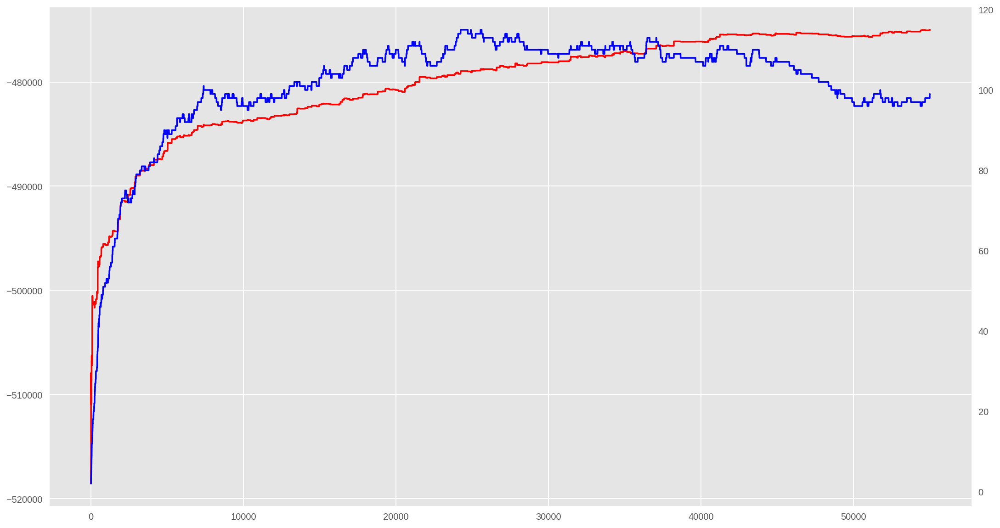

In [78]:
fig, ax1 = plt.subplots(figsize=(18, 10))
ax1.plot([x[0] for x in post_ncluster[0:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:]], color='b')
plt.grid(False)
plt.show()

In [80]:
max_s[:1000]

array([372, 510, 540, 405, 465, 264, 480, 480, 521, 264, 210, 212, 528,
       495, 358, 505, 358, 210, 528, 279, 528, 360, 541, 525, 212, 385,
       497, 355, 531, 497, 491, 283, 128, 283, 542, 454, 497, 526, 355,
       526, 543, 543, 480, 121, 341, 498, 434, 526, 505, 434, 492, 128,
       465, 407, 405, 491, 465, 465, 519, 328, 465, 528, 528, 465, 448,
       405, 543, 328, 526, 448, 505, 519, 543, 532, 465, 537, 385, 361,
       448, 465, 395, 492, 519, 491, 519, 535, 519, 519, 361, 543, 498,
       460, 435, 480, 518, 505, 471, 434, 480, 498, 434, 471, 531, 235,
       328, 376, 498, 397, 285, 519, 542, 128, 521, 497, 513, 340, 519,
       519, 212, 519, 536, 542, 448, 519, 451, 434, 465, 413, 334, 495,
       358, 413, 541, 541, 334, 413, 525, 528, 210, 442, 334, 541, 510,
       355, 169, 450, 491, 491, 385, 328, 405, 498, 498, 497, 397, 465,
       491, 480, 285, 543, 536, 536, 532, 513, 128, 362, 505, 519, 395,
       519, 519, 448, 536, 519, 397, 285, 531, 532, 454, 532, 28